In [1]:
!git clone https://github.com/brunoaugustoam/MorphologyAnalysisFromSegmentation.git

!mv /content/MorphologyAnalysisFromSegmentation/SAM-BasedMethod/particle_loader.py /content/
!mv /content/MorphologyAnalysisFromSegmentation/SAM-BasedMethod/particle_seg.py /content/
!mv /content/MorphologyAnalysisFromSegmentation/SAM-BasedMethod/plots.py /content/


Cloning into 'MorphologyAnalysisFromSegmentation'...
remote: Enumerating objects: 80, done.
remote: Counting objects: 100% (15/15), done.
remote: Compressing objects: 100% (12/12), done.
remote: Total 80 (delta 3), reused 12 (delta 3), pack-reused 65
Receiving objects: 100% (80/80), 88.65 MiB | 28.79 MiB/s, done.
Resolving deltas: 100% (6/6), done.


In [2]:
from particle_seg import *
from particle_loader import *
from plots import *

import os
import pandas as pd

ratio = 300/68

In [3]:
using_colab = True
if using_colab:

    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    if os.path.exists('/content/sam_vit_h_4b8939.pth'):
      print('ok')
    else:
      !{sys.executable} -m pip install opencv-python matplotlib
      !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'

      !wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth



PyTorch version: 2.1.0+cu121
Torchvision version: 0.16.0+cu121
CUDA is available: True
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-0pyx9lpw
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-0pyx9lpw
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py) ... done
  Created wheel for segment-anything: filename=segment_anything-1.0-py3-none-any.whl size=36587 sha256=f76dfa55aa2787e609917ff2cc7db8adae29c6fbfd9f80e79a294811feb8b699
  Stored in directory: /tmp/pip-ephem-wheel-cache-8ffc3s3r/wheels/10/cf/59/9ccb2f0a1bcc81d4fbd0e501680b5d088d690c6cfbc02dc99d
Successfully built segment-anything
--2024-03-01 16:27:18--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 3.162.163.19, 3.162.163.51, 3.

In [4]:
img_idx='116'

if os.path.isdir('results'):
  print('ok')
else:
  !mkdir results

save_path = os.path.join(os.getcwd(),'results')
save_path

'/content/results'

In [5]:
sam_checkpoint = "sam_vit_h_4b8939.pth"

device = "cuda"
model_type = "vit_h"

from segment_anything import SamAutomaticMaskGenerator, sam_model_registry
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

print('ok')


ok


In [6]:
mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=36,
    pred_iou_thresh=0.80,
    stability_score_thresh=0.80,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=350,  # Requires open-cv to run post-processing
)

In [7]:
data_path = os.path.join(os.getcwd(),'MorphologyAnalysisFromSegmentation', 'Dataset', 'SEM')

In [8]:
img_set = Particle_Dataset(root = data_path,img_idx=img_idx)
print("Analinsando",img_set.__len__(),'imagens')
img_set.files

Analinsando 10 imagens


['GM 116_20.tif',
 'GM 116_21.tif',
 'GM 116_22.tif',
 'GM 116_23.tif',
 'GM 116_24.tif',
 'GM 116_25.tif',
 'GM 116_26.tif',
 'GM 116_27.tif',
 'GM 116_28.tif',
 'GM 116_29.tif']

0/10
Analizing particle: GM 116_20


/content/particle_seg.py:1006: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_paired['lobe'] = ''


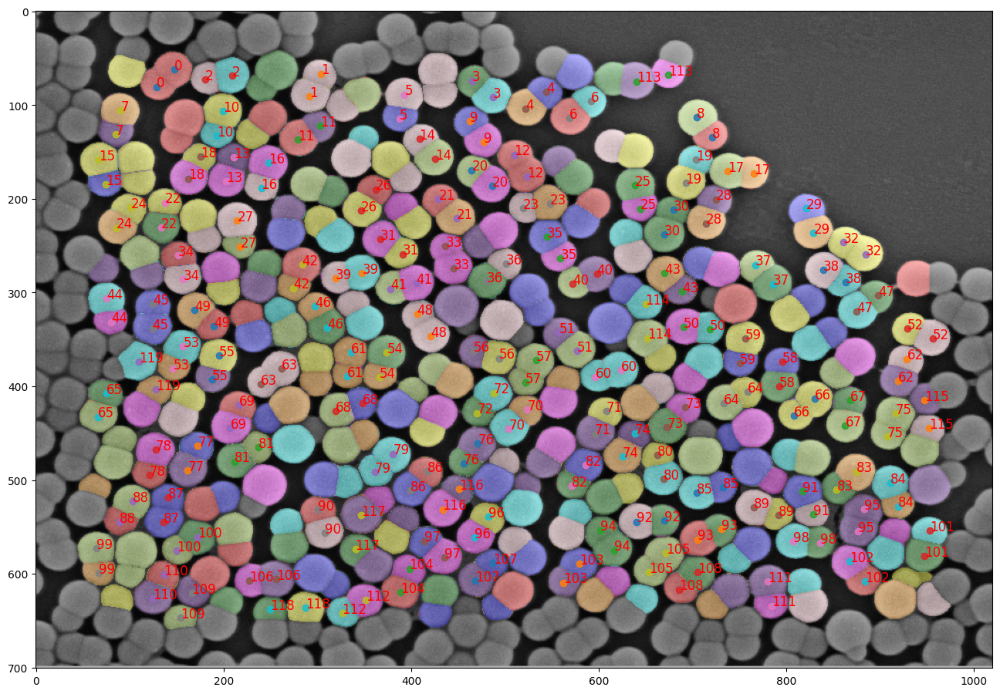

image from GM 116_20 saved!
1/10
Analizing particle: GM 116_21


/content/particle_seg.py:1006: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_paired['lobe'] = ''


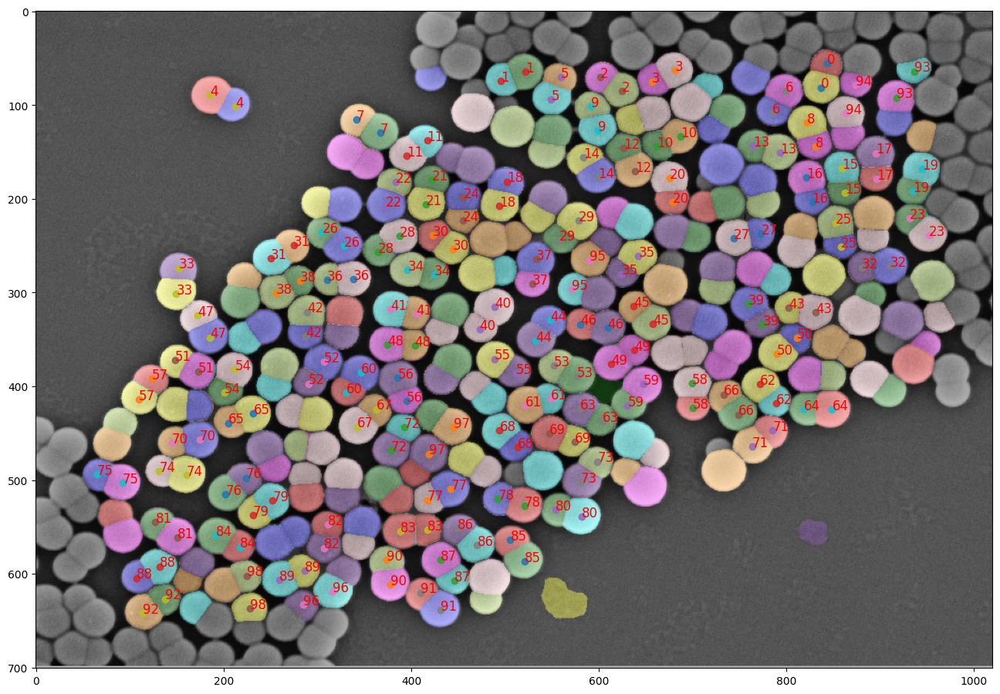

image from GM 116_21 saved!
2/10
Analizing particle: GM 116_22


/content/particle_seg.py:1006: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_paired['lobe'] = ''


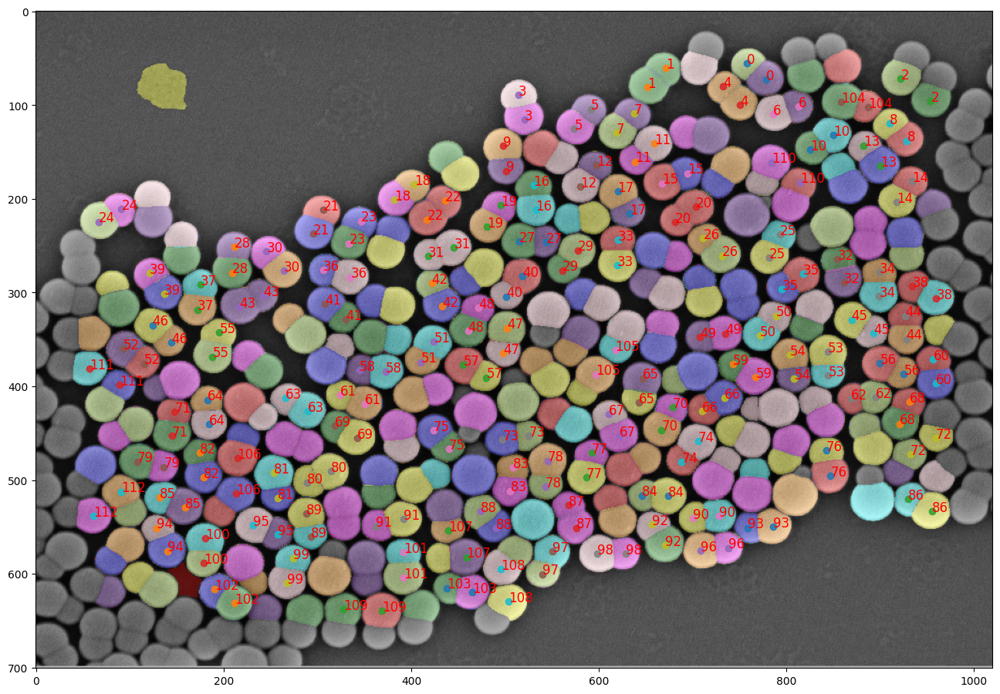

image from GM 116_22 saved!
3/10
Analizing particle: GM 116_23


/content/particle_seg.py:1006: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_paired['lobe'] = ''


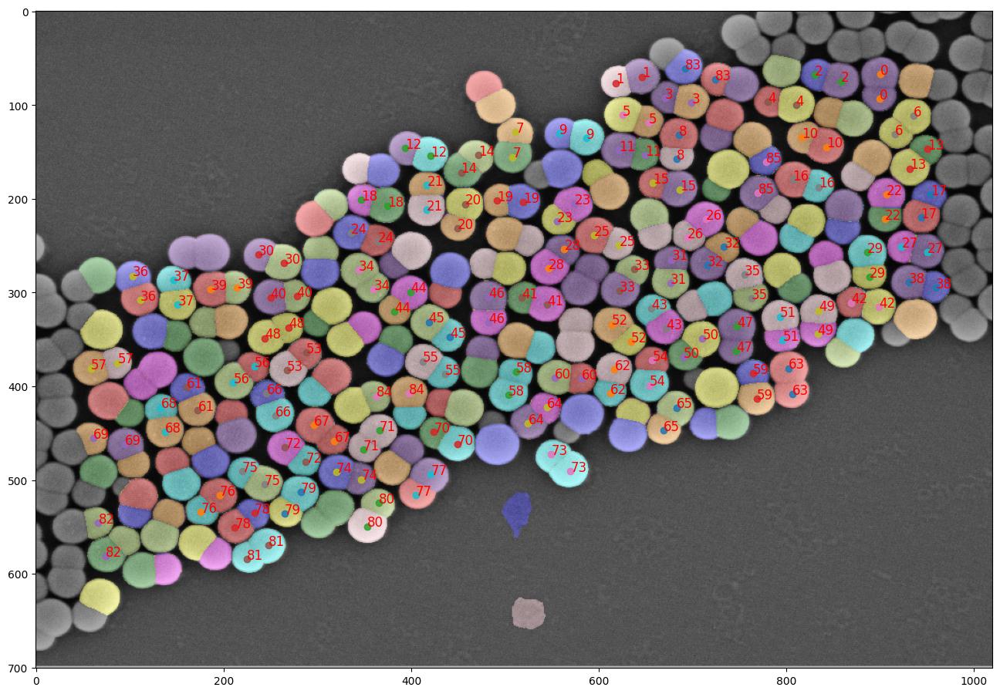

image from GM 116_23 saved!
4/10
Analizing particle: GM 116_24


/content/particle_seg.py:1006: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_paired['lobe'] = ''


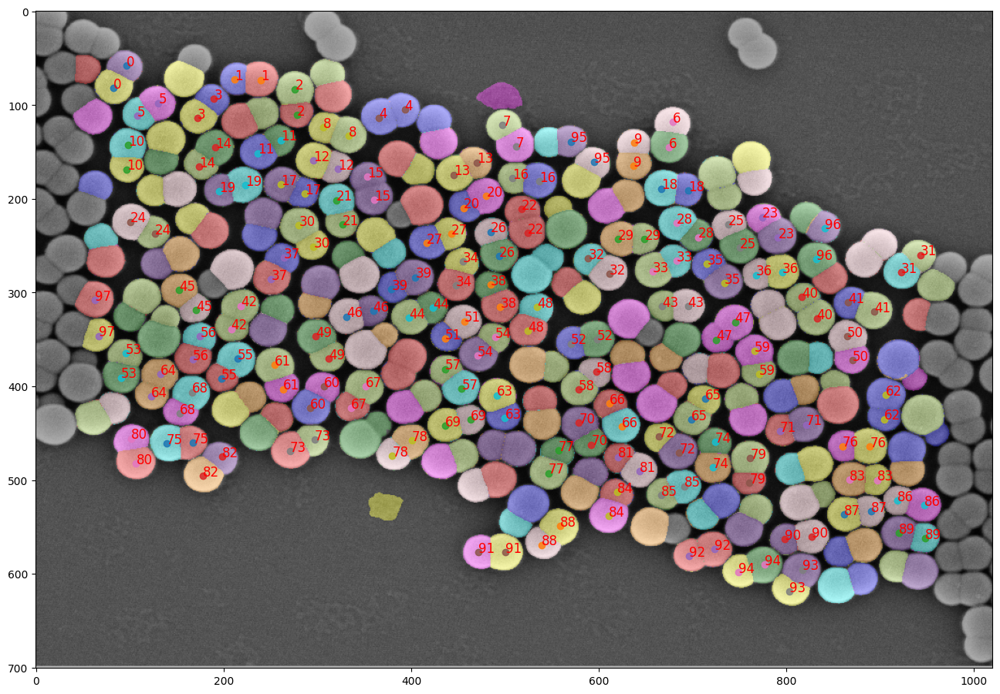

image from GM 116_24 saved!
5/10
Analizing particle: GM 116_25


/content/particle_seg.py:1006: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_paired['lobe'] = ''


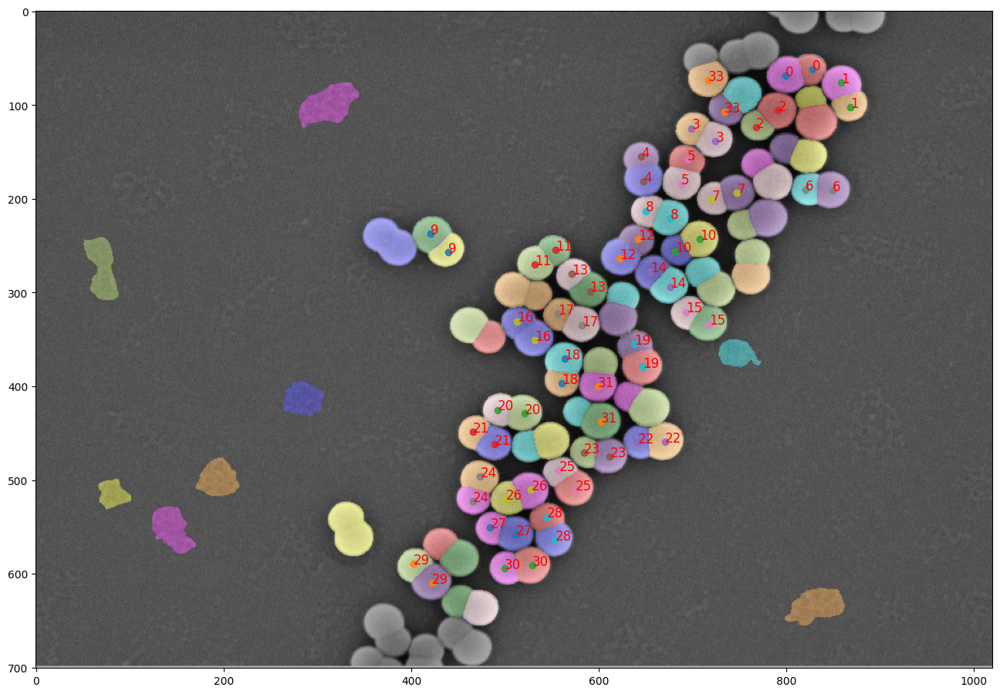

image from GM 116_25 saved!
6/10
Analizing particle: GM 116_26


/content/particle_seg.py:1006: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_paired['lobe'] = ''


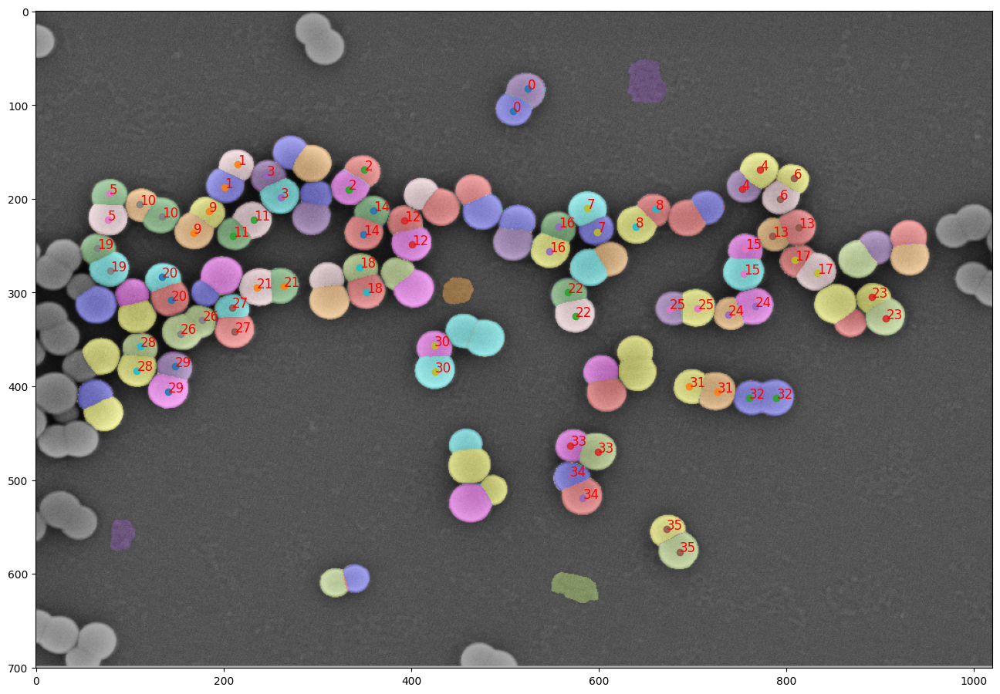

image from GM 116_26 saved!
7/10
Analizing particle: GM 116_27


/content/particle_seg.py:1006: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_paired['lobe'] = ''


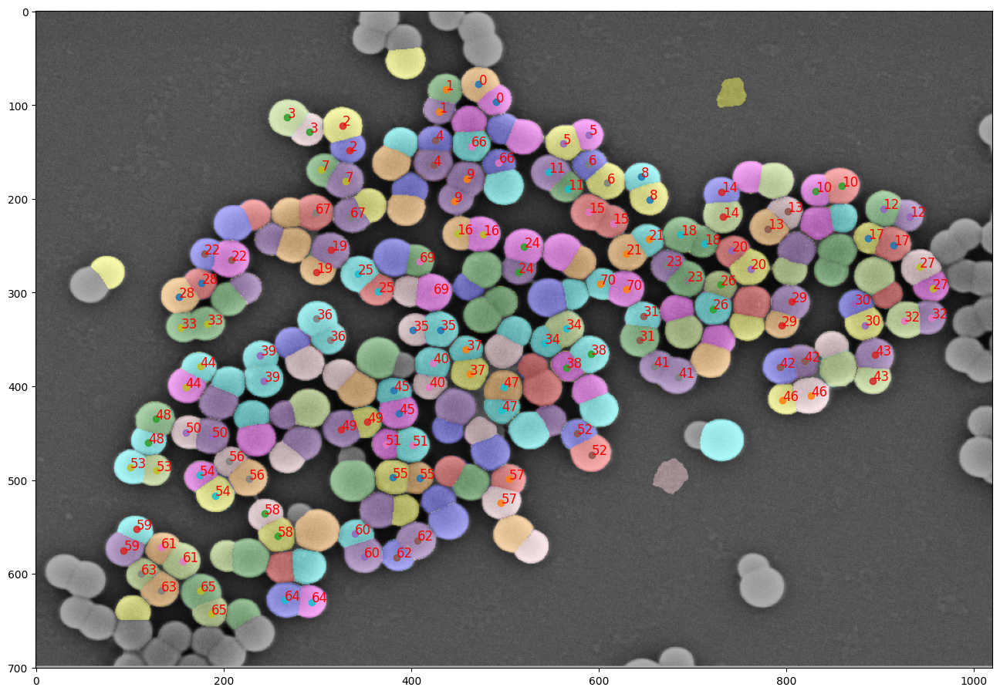

image from GM 116_27 saved!
8/10
Analizing particle: GM 116_28


/content/particle_seg.py:1006: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_paired['lobe'] = ''


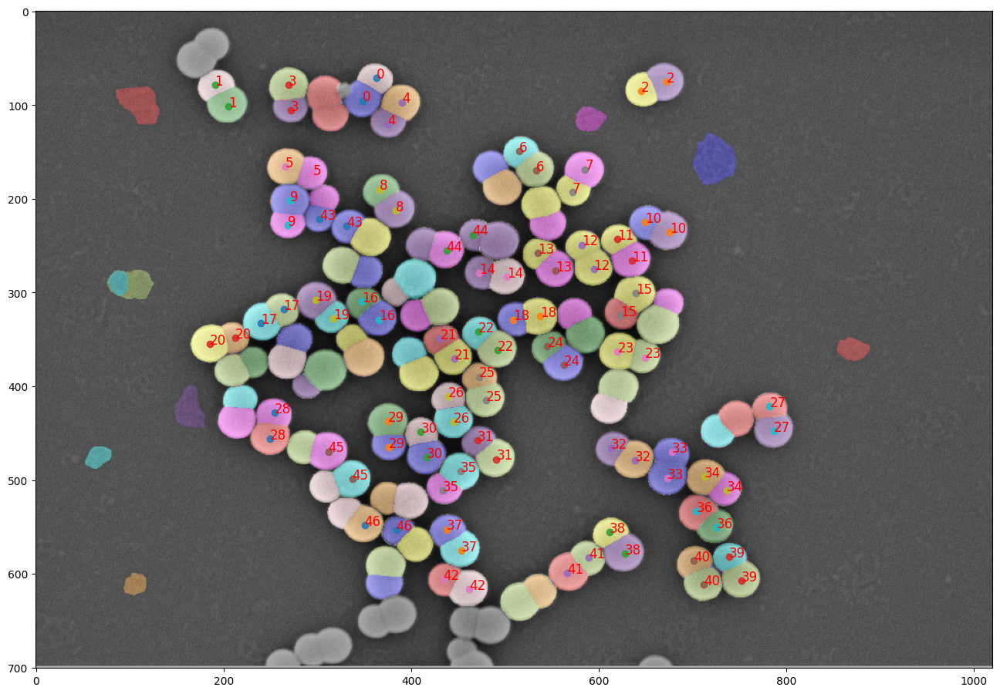

image from GM 116_28 saved!
9/10
Analizing particle: GM 116_29


/content/particle_seg.py:1006: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_paired['lobe'] = ''


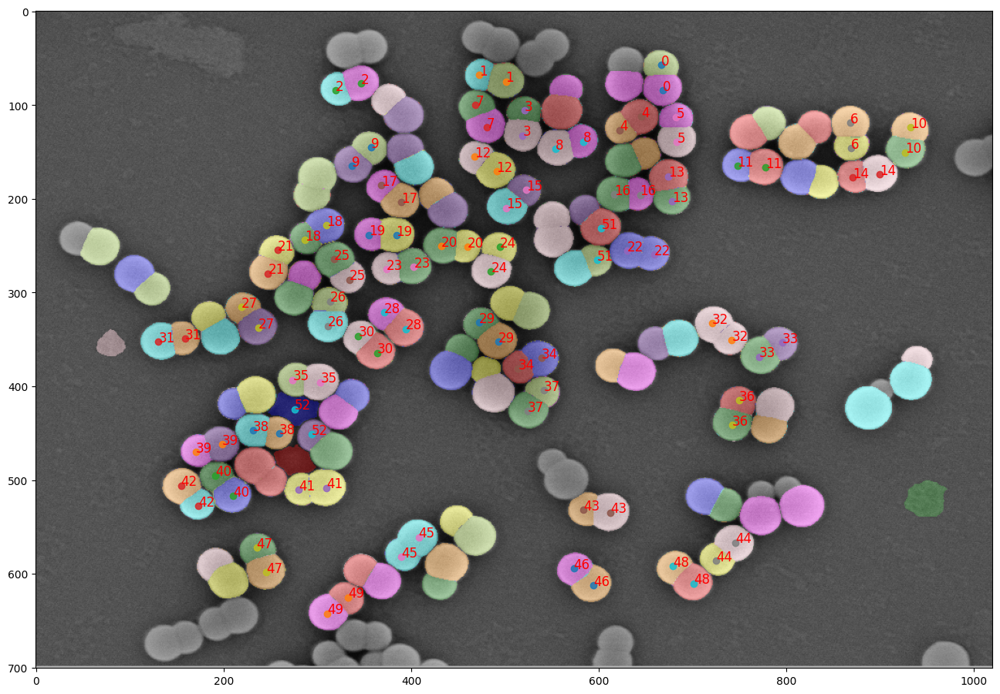

image from GM 116_29 saved!


In [9]:
for idx in range(0,img_set.__len__()):

    print(f'{idx}/{img_set.__len__()}')

    img, name = img_set.__getitem__(idx)
    saving_name = name.split('.')[0]
    print(f'Analizing particle: {saving_name}')

    comined_mask, simple_mask, dataframe_SAM = SAM_analysis(img,mask_generator)
    # dataframe_SAM.to_excel(f'{save_path}/df_SAM_orig_{saving_name}.xlsx')

    comb_mask = get_cob_mask_from_sam(dataframe_SAM)
    #plot_seg_mask(img,comb_mask)

    sam_df = label_props_SAM(img,comb_mask)

    df_dumbbels = define_particle_lobes_from_regionprops(sam_df)

    df_dumbbels['img_name'] = saving_name
    plot_dumbbells(df_dumbbels, img, comb_mask=comb_mask,save=True,name=saving_name,save_path=save_path)

    df_dumbbels.to_excel(f'{save_path}/df_analized_{saving_name}.xlsx')
    print(f'image from {saving_name} saved!')

In [10]:
files = os.listdir(save_path)
filtered_files = sorted([ f'{save_path}/'+r for r in files if  r.split('.')[-1]=='xlsx' ])
filtered_files = sorted([r for r in filtered_files if  r.split('_')[1]=='analized' ])
filtered_files

['/content/results/df_analized_GM 116_20.xlsx',
 '/content/results/df_analized_GM 116_21.xlsx',
 '/content/results/df_analized_GM 116_22.xlsx',
 '/content/results/df_analized_GM 116_23.xlsx',
 '/content/results/df_analized_GM 116_24.xlsx',
 '/content/results/df_analized_GM 116_25.xlsx',
 '/content/results/df_analized_GM 116_26.xlsx',
 '/content/results/df_analized_GM 116_27.xlsx',
 '/content/results/df_analized_GM 116_28.xlsx',
 '/content/results/df_analized_GM 116_29.xlsx']

In [11]:
init = True
for file in filtered_files:
    df_temp = pd.read_excel(file)
    if init:
        df_concat = df_temp.copy()
        init=False
    else:
        df_concat = pd.concat([df_concat,df_temp])
df_concat.to_excel(f'{save_path}/results_for_idx_{img_idx}.xlsx')

In [12]:
df_concat

,Unnamed: 0,area,convex_area,mean_intensity,label,perimeter,centroid,axis_major_length,feret_diameter_max,orientation,...,eccentricity,bbox,circularity,candidate,par,ID,distance,radius,lobe,img_name
0,0,1088,1120,[164.046875 164.046875 164.046875],3,124.367532,"(61.71875, 147.45863970588235)",40.900092,41.976184,0.993663,...,0.543450,"(44, 126, 83, 167)",0.883944,"[11, 8, 2]","[0, 11]",0,26.900694,20.450046,maior,GM 116_20
1,4,756,786,[162.78703704 162.78703704 162.78703704],19,106.911688,"(66.54232804232804, 303.6970899470899)",37.087888,37.161808,1.217238,...,0.695170,"(53, 285, 83, 321)",0.831154,"[16, 19, 13]","[4, 16]",1,26.964450,18.543944,menor,GM 116_20
2,5,819,847,[215.73137973 215.73137973 215.73137973],14,108.911688,"(67.61782661782662, 673.8595848595849)",36.387814,36.878178,1.281096,...,0.597590,"(52, 657, 83, 693)",0.867650,"[10, 23, 7]","[10, 5]",113,34.094650,18.193907,menor,GM 116_20
3,6,1125,1165,[150.31466667 150.31466667 150.31466667],11,126.911688,"(68.72177777777777, 208.95466666666667)",39.424116,41.048752,0.100273,...,0.362686,"(50, 191, 89, 228)",0.877726,"[8, 22, 24]","[6, 8]",2,28.703702,19.712058,maior,GM 116_20
4,8,783,813,[143.550447 143.550447 143.550447],23,106.426407,"(72.39208173690932, 180.48659003831418)",35.609864,35.693137,0.122821,...,0.594486,"(55, 166, 90, 195)",0.868706,"[6, 0, 22]","[6, 8]",2,28.703702,17.804932,menor,GM 116_20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99,145,1187,1216,[163.37994945 163.37994945 163.37994945],1508,127.982756,"(598.2662173546756, 245.36731255265374)",42.342855,43.011626,-1.299094,...,0.526165,"(580, 225, 617, 266)",0.910663,"[138, 146, 141]","[145, 138]",47,27.997416,21.171428,maior,GM 116_29
100,148,1176,1197,[205.02721088 205.02721088 205.02721088],1545,126.610173,"(610.2610544217687, 701.0671768707483)",41.211817,43.680659,-1.067512,...,0.455076,"(589, 680, 629, 722)",0.921892,"[142, 140, 137]","[148, 142]",48,28.809113,20.605909,maior,GM 116_29
101,149,1091,1172,[187.14207149 187.14207149 187.14207149],1554,130.367532,"(612.6049495875344, 594.1549037580202)",44.034762,44.384682,-0.943864,...,0.667650,"(591, 571, 631, 614)",0.806670,"[143, 134, 133]","[143, 149]",46,27.970473,22.017381,maior,GM 116_29
102,151,839,870,[184.82359952 184.82359952 184.82359952],1608,109.882251,"(625.0441001191895, 332.87604290822406)",39.203345,39.560081,0.889256,...,0.699223,"(610, 313, 644, 350)",0.873206,"[152, 144, 147]","[152, 151]",49,28.407611,19.601672,menor,GM 116_29
